In [0]:
%matplotlib inline
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torch import autograd
from torch.autograd import Variable
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

In [2]:
a = np.array([1, 0, 3, 9])
b = np.zeros((a.size, a.max()+1))
c = np.arange(a.size)
b[c,a] = 1
b


array([[0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

In [3]:
transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5,), std=(0.5,))
])
dataset = torchvision.datasets.FashionMNIST('./data/', download=True, transform=transform, train=True)
print(len(dataset))
data_loader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)

60000


In [0]:
def to_onehot(x, num_classes=10):
    assert isinstance(x, int) or isinstance(x, (torch.LongTensor, torch.cuda.LongTensor))#for checking integer
    if isinstance(x, int):
        c = torch.zeros(1, num_classes).long()
        c[0][x] = 1
    else:
        x = x.cpu()
        c = torch.LongTensor(x.size(0), num_classes)
        c.zero_()
        c.scatter_(1, x, 1) # dim, index, src value
    return c

In [5]:
to_onehot(5)

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0]])

In [0]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        
        #self.label_emb = nn.Embedding(10, 10) #(vocab_size,vector_size)
        #print( self.label_emb.weight)
        self.model = nn.Sequential(
            nn.Linear(794, 1024),
            nn.LeakyReLU(0.2, inplace=True), # when not active it is 0.2*x (if x < 0)
            nn.Dropout(0.3), # to reduce overfitting
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid() # because discriminator gives us probability which must lie between [0, 1]
        )
    
    def forward(self, x, labels):
        x = x.view(x.size(0), 784) #flatten the image
        labels.view(labels.size(0), -1) #10-D vector for the passed label
        x = torch.cat((x, labels.float()), 1) #merging the two inputs to be fed to the Discriminator
        out = self.model(x)
        return out.squeeze()

In [0]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        
        #self.label_emb = nn.Embedding(10, 10)
        
        self.model = nn.Sequential(
            nn.Linear(110, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 784),
            nn.Tanh()
        )
    
    def forward(self, z, labels):
        z = z.view(z.size(0), 100)
        labels.view(labels.size(0), -1)
        x = torch.cat((z, labels.float()), 1)
        out = self.model(x)
        return out.view(x.size(0), 1, 28, 28)

In [0]:
generator = Generator().cuda()
discriminator = Discriminator().cuda()

In [0]:
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=1e-4)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=1e-4)

In [0]:
def generator_train_step(batch_size, discriminator, generator, g_optimizer, criterion, labels):
    g_optimizer.zero_grad() #intialize the gradient to zero after each iteration/updation
    z = Variable(torch.randn(batch_size, 100)).cuda() #noise vector
    fake_labels = Variable(torch.LongTensor(np.random.randint(0, 10, batch_size))).cuda() #64 size labels ranging from 0-9
    fake_images = generator(z, labels)
    validity = discriminator(fake_images, labels)
    g_loss = criterion(validity, Variable(torch.ones(batch_size)).cuda())
    g_loss.backward()
    #Use for loop to replace step()
    #Or come up with a function to avoid discriminator being trained as well
    g_optimizer.step()
    return g_loss.item()

In [0]:
def discriminator_train_step(batch_size, discriminator, generator, d_optimizer, criterion, real_images, labels):
    d_optimizer.zero_grad()
    #print("Print here...1")
    #print(real_images.shape)
    # train with real images
    real_validity = discriminator(real_images, labels)
    real_loss = criterion(real_validity, Variable(torch.ones(batch_size)).cuda())
    #print("Print here...2")
    # train with fake images
    z = Variable(torch.randn(batch_size, 100)).cuda() #64 X 100(noise)
    fake_labels = Variable(torch.LongTensor(np.random.randint(0, 10, batch_size))).cuda()#64 rows of labels ranging from 0-9
    fake_images = generator(z, labels) #Generate 64 images for the 64 noise inputs
    #print("Print here...3")
    #print(fake_images.shape)
    fake_validity = discriminator(fake_images.detach(), labels) # 64 * 784, 64
    fake_loss = criterion(fake_validity, Variable(torch.zeros(batch_size)).cuda())
    
    d_loss = real_loss + fake_loss
    d_loss.backward()
    d_optimizer.step()
    return d_loss.item()

In [0]:
def get_sample_image(G, n_noise=100):
    """
        save sample 100 images
    """
    img = np.zeros([280, 280])
    for j in range(10):
        c = torch.zeros([10, 10]).cuda()
        c[:, j] = 1
        z = torch.randn(10, n_noise).cuda()
        y_hat = G(z,c).view(10, 28, 28)
        result = y_hat.cpu().data.numpy()
        img[j*28:(j+1)*28] = np.concatenate([x for x in result], axis=-1)
    return img

Starting epoch 0...
g_loss: 4.566196441650391, d_loss: 0.36500996351242065


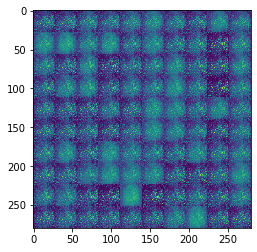

Starting epoch 1...
g_loss: 3.6663432121276855, d_loss: 0.2965568006038666


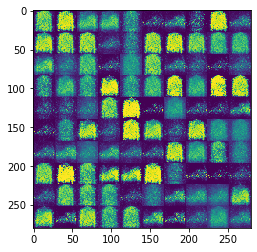

Starting epoch 2...
g_loss: 4.954953193664551, d_loss: 0.2008296549320221


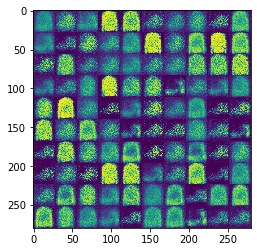

Starting epoch 3...
g_loss: 4.005444526672363, d_loss: 0.34429800510406494


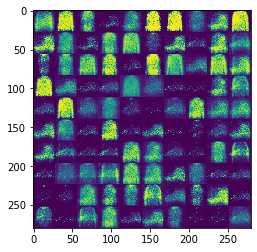

Starting epoch 4...
g_loss: 2.595463514328003, d_loss: 0.51914381980896


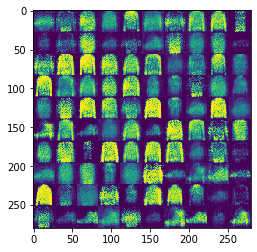

Starting epoch 5...
g_loss: 2.383091449737549, d_loss: 0.497928649187088


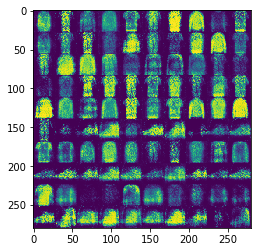

Starting epoch 6...
g_loss: 2.731843948364258, d_loss: 0.33968132734298706


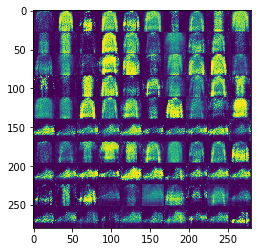

Starting epoch 7...
g_loss: 2.2327327728271484, d_loss: 0.5853734016418457


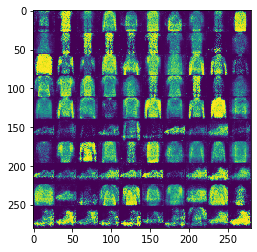

Starting epoch 8...
g_loss: 1.4974141120910645, d_loss: 0.7055264711380005


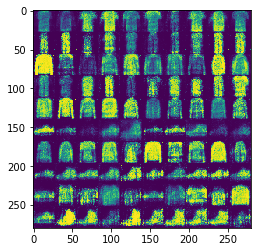

Starting epoch 9...
g_loss: 2.1865172386169434, d_loss: 0.5767260789871216


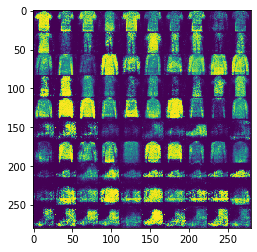

Starting epoch 10...
g_loss: 2.5368497371673584, d_loss: 0.5376411080360413


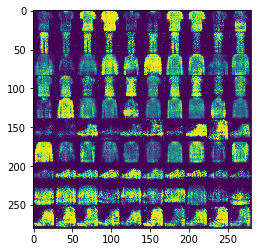

Starting epoch 11...
g_loss: 1.930896520614624, d_loss: 1.048945426940918


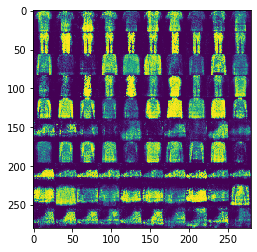

Starting epoch 12...
g_loss: 1.5826866626739502, d_loss: 0.7821744680404663


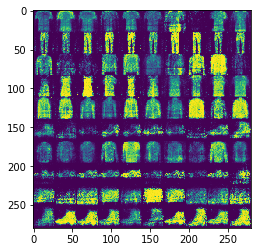

Starting epoch 13...
g_loss: 1.8016796112060547, d_loss: 0.7539159059524536


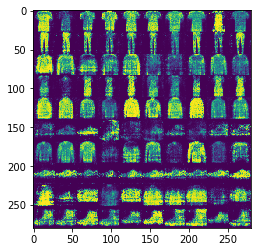

Starting epoch 14...
g_loss: 2.0809452533721924, d_loss: 0.8714999556541443


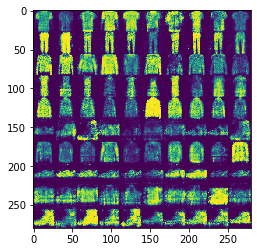

Starting epoch 15...
g_loss: 1.7291221618652344, d_loss: 0.6017472743988037


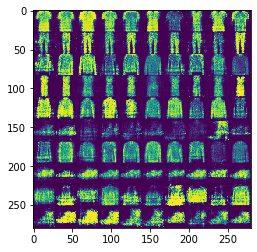

Starting epoch 16...
g_loss: 1.7693326473236084, d_loss: 1.197352647781372


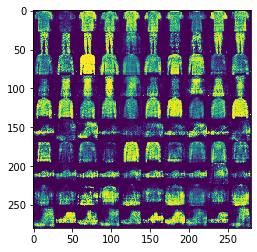

Starting epoch 17...
g_loss: 1.5016465187072754, d_loss: 1.034024953842163


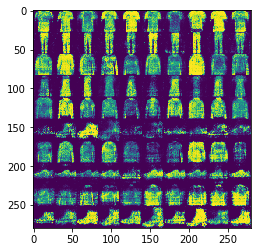

Starting epoch 18...
g_loss: 1.6383363008499146, d_loss: 0.8799910545349121


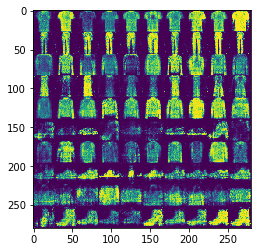

Starting epoch 19...
g_loss: 1.9100466966629028, d_loss: 0.7816075682640076


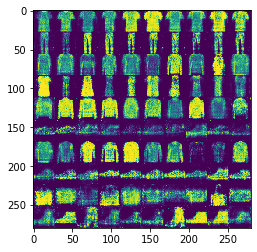

Starting epoch 20...
g_loss: 1.5195919275283813, d_loss: 0.7071171402931213


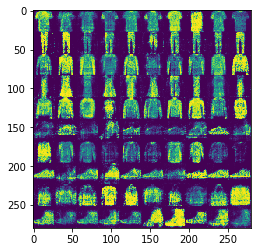

Starting epoch 21...
g_loss: 1.3990895748138428, d_loss: 0.9473822116851807


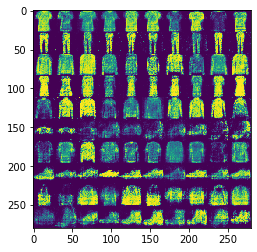

Starting epoch 22...
g_loss: 1.573889970779419, d_loss: 0.9502057433128357


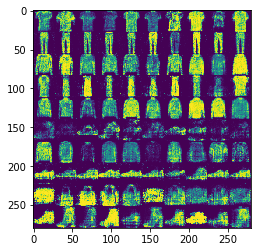

Starting epoch 23...
g_loss: 1.441731333732605, d_loss: 1.0521811246871948


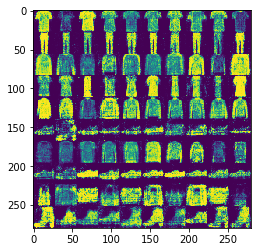

Starting epoch 24...
g_loss: 1.3845529556274414, d_loss: 1.0126910209655762


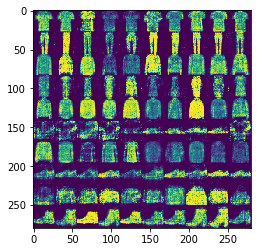

Starting epoch 25...
g_loss: 1.444633960723877, d_loss: 1.0938466787338257


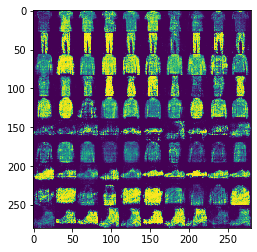

Starting epoch 26...
g_loss: 1.1926474571228027, d_loss: 0.7786500453948975


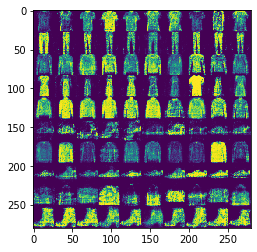

Starting epoch 27...
g_loss: 1.2015001773834229, d_loss: 1.1336708068847656


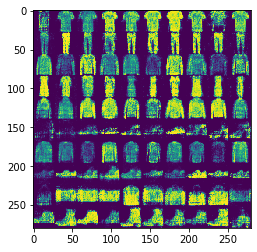

Starting epoch 28...
g_loss: 1.2514044046401978, d_loss: 1.1907118558883667


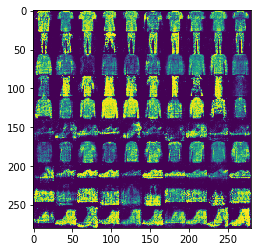

Starting epoch 29...
g_loss: 1.0533056259155273, d_loss: 0.8855598568916321


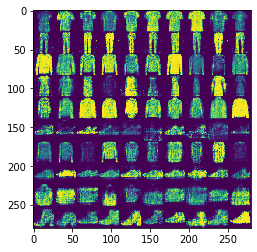

Starting epoch 30...
g_loss: 1.068021535873413, d_loss: 1.0384923219680786


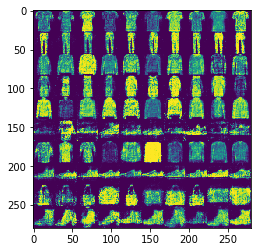

Starting epoch 31...
g_loss: 1.1914316415786743, d_loss: 1.1786391735076904


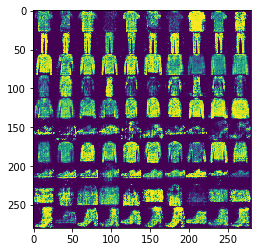

Starting epoch 32...
g_loss: 1.2697863578796387, d_loss: 1.1650069952011108


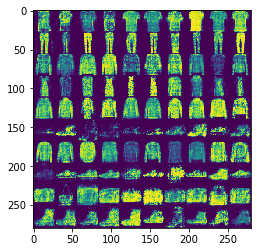

Starting epoch 33...
g_loss: 1.3442285060882568, d_loss: 1.0379947423934937


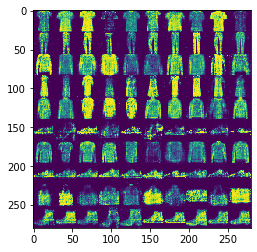

Starting epoch 34...
g_loss: 1.1964092254638672, d_loss: 1.2433512210845947


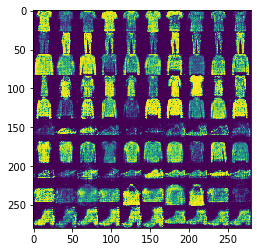

Starting epoch 35...
g_loss: 1.1217175722122192, d_loss: 1.015656590461731


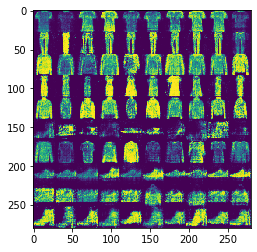

Starting epoch 36...
g_loss: 1.2122960090637207, d_loss: 1.2296757698059082


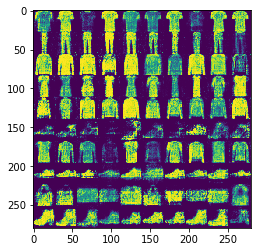

Starting epoch 37...
g_loss: 0.9534288644790649, d_loss: 1.2359373569488525


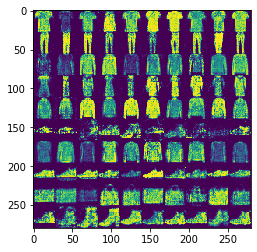

Starting epoch 38...
g_loss: 1.2125182151794434, d_loss: 1.01505446434021


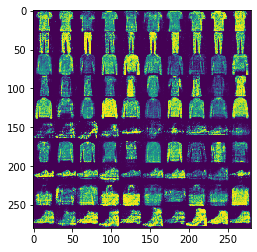

Starting epoch 39...
g_loss: 1.3299193382263184, d_loss: 1.217104196548462


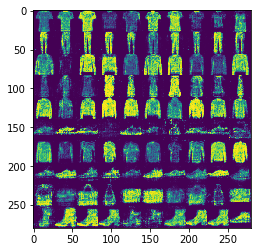

Starting epoch 40...
g_loss: 1.083256721496582, d_loss: 1.1873347759246826


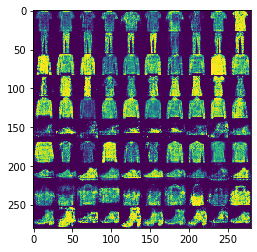

Starting epoch 41...
g_loss: 1.1048016548156738, d_loss: 0.9252343773841858


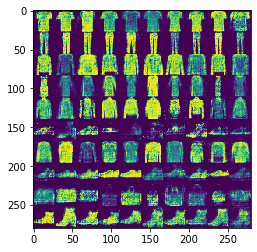

Starting epoch 42...
g_loss: 1.0726146697998047, d_loss: 1.230725646018982


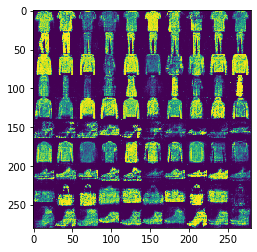

Starting epoch 43...
g_loss: 1.228122353553772, d_loss: 1.214275598526001


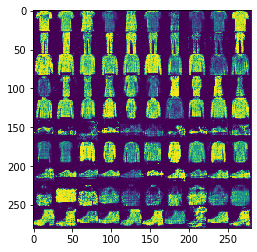

Starting epoch 44...
g_loss: 1.0814707279205322, d_loss: 1.1918166875839233


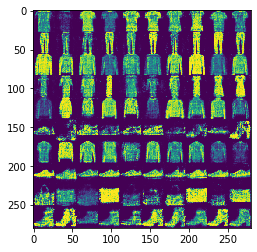

Starting epoch 45...
g_loss: 1.00062894821167, d_loss: 1.1628820896148682


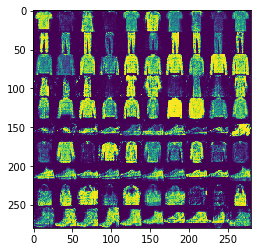

Starting epoch 46...
g_loss: 0.9267886877059937, d_loss: 1.3086845874786377


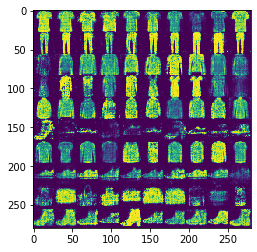

Starting epoch 47...
g_loss: 1.1330493688583374, d_loss: 1.147688388824463


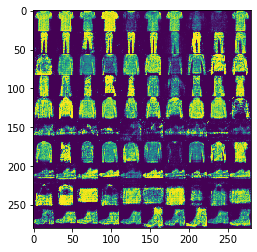

Starting epoch 48...
g_loss: 0.9792624711990356, d_loss: 1.3423678874969482


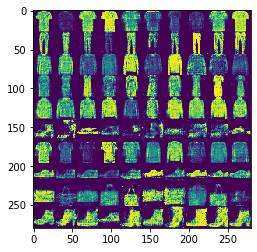

Starting epoch 49...
g_loss: 1.1198196411132812, d_loss: 1.190813660621643


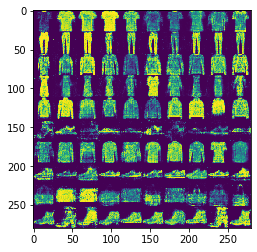

Starting epoch 50...
g_loss: 0.9899035096168518, d_loss: 1.085947036743164


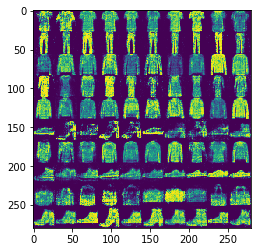

Starting epoch 51...
g_loss: 1.1217397451400757, d_loss: 0.9288915395736694


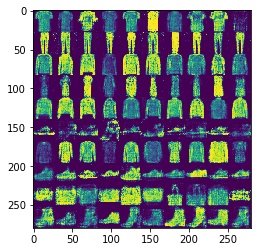

Starting epoch 52...
g_loss: 1.1314496994018555, d_loss: 1.0929771661758423


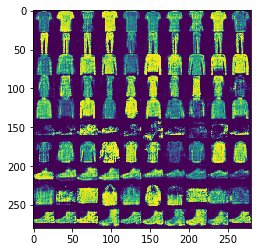

Starting epoch 53...
g_loss: 1.0124692916870117, d_loss: 1.0574150085449219


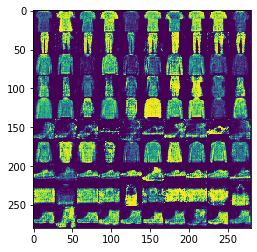

Starting epoch 54...
g_loss: 1.0017738342285156, d_loss: 1.0766714811325073


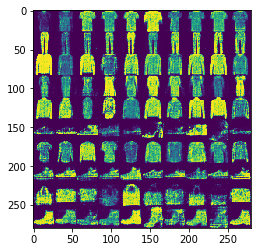

Starting epoch 55...
g_loss: 0.8800002336502075, d_loss: 1.231876015663147


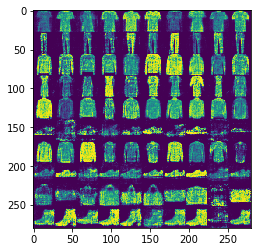

Starting epoch 56...
g_loss: 1.14998197555542, d_loss: 1.036608099937439


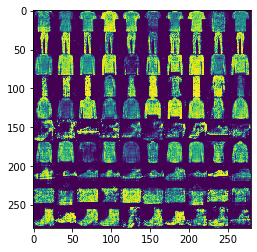

Starting epoch 57...
g_loss: 1.1187677383422852, d_loss: 1.0970288515090942


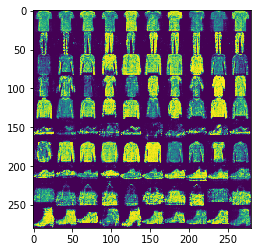

Starting epoch 58...
g_loss: 1.0523948669433594, d_loss: 1.1185275316238403


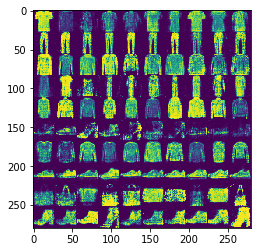

Starting epoch 59...
g_loss: 0.9595208168029785, d_loss: 1.1959774494171143


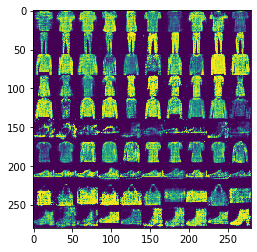

Starting epoch 60...
g_loss: 0.9124870300292969, d_loss: 1.1370142698287964


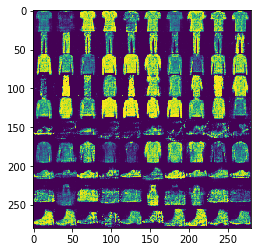

Starting epoch 61...
g_loss: 1.2029550075531006, d_loss: 1.2342548370361328


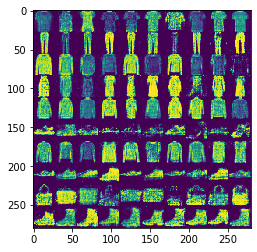

Starting epoch 62...
g_loss: 0.9547723531723022, d_loss: 1.102184772491455


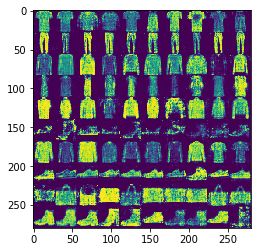

Starting epoch 63...
g_loss: 1.0817170143127441, d_loss: 1.2439817190170288


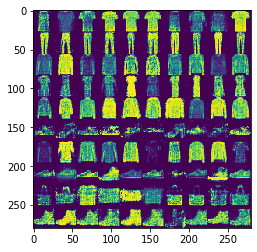

Starting epoch 64...
g_loss: 0.9125539064407349, d_loss: 1.1867724657058716


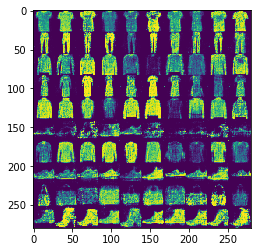

Starting epoch 65...
g_loss: 1.0030152797698975, d_loss: 1.310423731803894


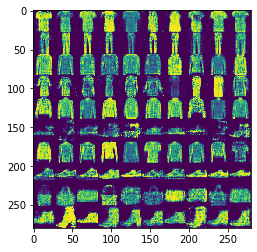

Starting epoch 66...
g_loss: 1.0545203685760498, d_loss: 1.1854310035705566


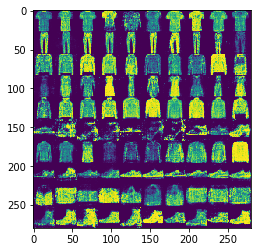

Starting epoch 67...
g_loss: 0.8257551193237305, d_loss: 1.3110485076904297


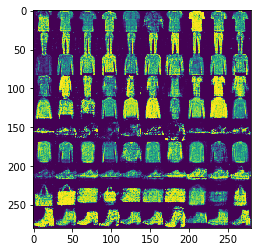

Starting epoch 68...
g_loss: 0.943551778793335, d_loss: 1.2004761695861816


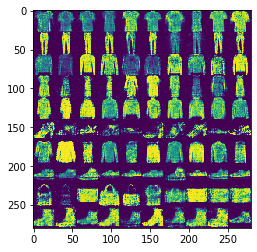

Starting epoch 69...
g_loss: 0.8700211644172668, d_loss: 1.436316967010498


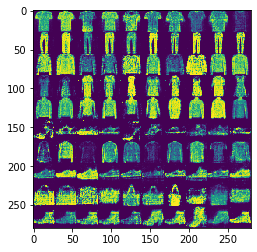

Starting epoch 70...
g_loss: 0.8406052589416504, d_loss: 1.377793550491333


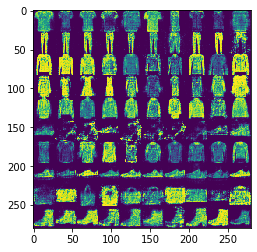

Starting epoch 71...
g_loss: 0.878328800201416, d_loss: 1.295548439025879


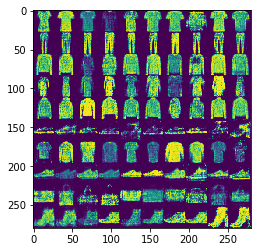

Starting epoch 72...
g_loss: 0.807410717010498, d_loss: 1.3379316329956055


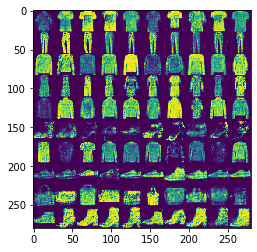

Starting epoch 73...
g_loss: 1.1139699220657349, d_loss: 1.330637812614441


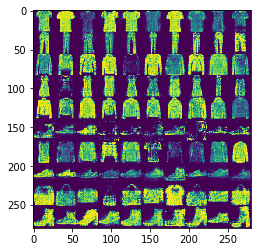

Starting epoch 74...
g_loss: 0.8793849349021912, d_loss: 1.3534088134765625


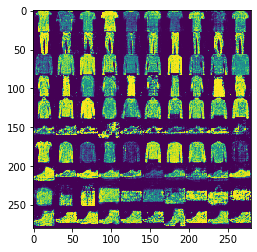

Starting epoch 75...
g_loss: 0.9241534471511841, d_loss: 1.3227531909942627


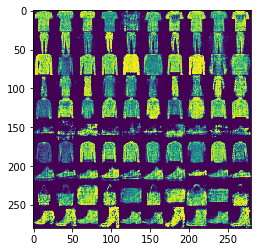

Starting epoch 76...
g_loss: 0.7948110699653625, d_loss: 1.3777185678482056


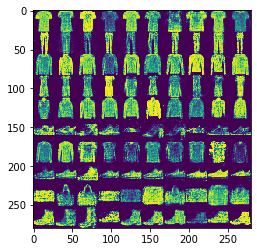

Starting epoch 77...
g_loss: 0.9571305513381958, d_loss: 1.245891809463501


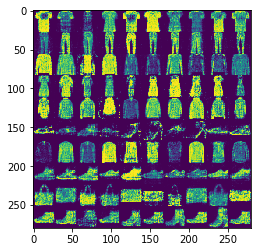

Starting epoch 78...
g_loss: 0.7860226035118103, d_loss: 1.2793703079223633


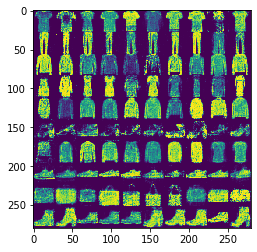

Starting epoch 79...
g_loss: 0.9638698101043701, d_loss: 1.1825921535491943


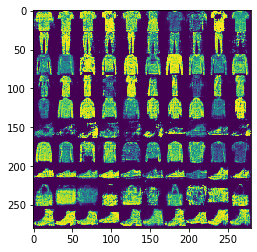

Starting epoch 80...
g_loss: 0.8752538561820984, d_loss: 1.4400544166564941


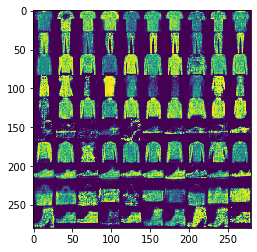

Starting epoch 81...
g_loss: 0.753227949142456, d_loss: 1.2043447494506836


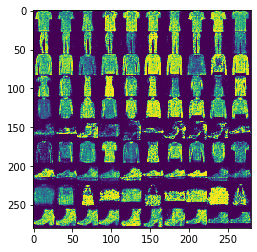

Starting epoch 82...
g_loss: 0.9579293727874756, d_loss: 1.1634207963943481


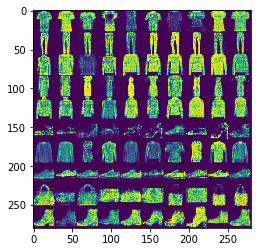

Starting epoch 83...
g_loss: 0.8552231788635254, d_loss: 1.2813022136688232


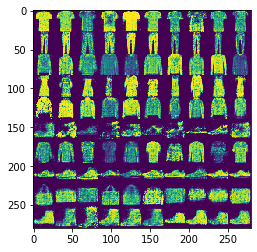

Starting epoch 84...
g_loss: 1.0036609172821045, d_loss: 1.4055131673812866


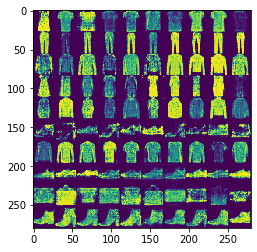

Starting epoch 85...
g_loss: 0.8659805059432983, d_loss: 1.2871062755584717


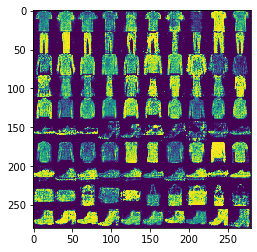

Starting epoch 86...
g_loss: 0.7677925825119019, d_loss: 1.2388477325439453


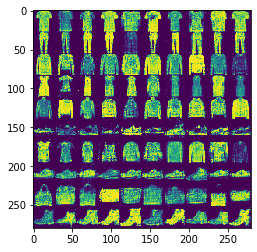

Starting epoch 87...
g_loss: 0.818274974822998, d_loss: 1.2760872840881348


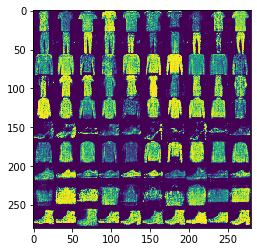

Starting epoch 88...
g_loss: 0.9384526014328003, d_loss: 1.2145750522613525


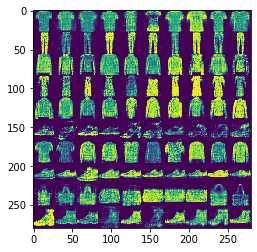

Starting epoch 89...
g_loss: 0.9833958148956299, d_loss: 1.3052705526351929


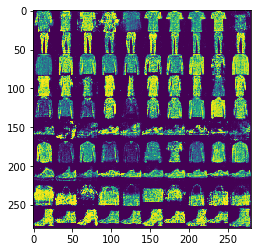

Starting epoch 90...
g_loss: 0.8062031865119934, d_loss: 1.3983895778656006


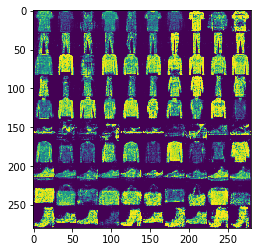

Starting epoch 91...
g_loss: 0.9300326108932495, d_loss: 1.2884650230407715


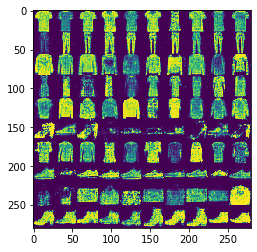

Starting epoch 92...
g_loss: 0.7181253433227539, d_loss: 1.261575698852539


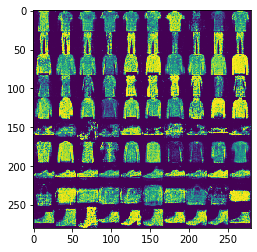

Starting epoch 93...
g_loss: 0.8932846784591675, d_loss: 1.2806668281555176


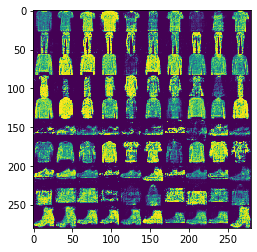

Starting epoch 94...
g_loss: 0.9006873369216919, d_loss: 1.2398231029510498


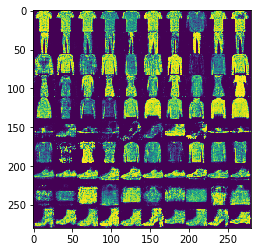

Starting epoch 95...
g_loss: 0.8984098434448242, d_loss: 1.3707396984100342


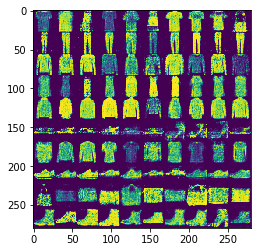

Starting epoch 96...
g_loss: 0.8348851799964905, d_loss: 1.3261964321136475


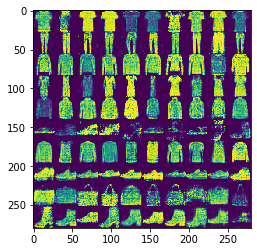

Starting epoch 97...
g_loss: 1.0149871110916138, d_loss: 1.273814082145691


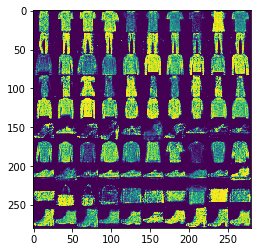

Starting epoch 98...
g_loss: 0.8909320831298828, d_loss: 1.1674411296844482


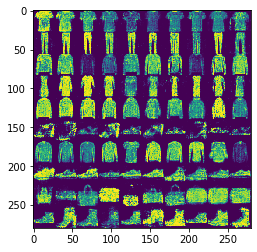

Starting epoch 99...
g_loss: 0.8665287494659424, d_loss: 1.3583507537841797


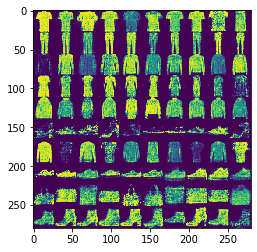

In [13]:
num_epochs = 100
n_critic = 5
display_step = 300
for epoch in range(num_epochs):
    print('Starting epoch {}...'.format(epoch))
    for i, (images, labels) in enumerate(data_loader):
        real_images = images.cuda()
        #labels = labels.cuda()
        generator.train()
        batch_size = real_images.size(0)
        labels = labels.view(batch_size, 1)
        labels = to_onehot(labels).cuda()
        
        d_loss = discriminator_train_step(len(real_images), discriminator,
                                          generator, d_optimizer, criterion,
                                          real_images, labels)
        

        g_loss = generator_train_step(batch_size, discriminator, generator, g_optimizer, criterion, labels)

    generator.eval()
    print('g_loss: {}, d_loss: {}'.format(g_loss, d_loss))
    #z = Variable(torch.randn(9, 100)).cuda()
    #labels = Variable(torch.LongTensor(np.arange(9))).cuda()
    #sample_images = generator(z, labels).unsqueeze(1).data.cpu()
    #grid = make_grid(sample_images, nrow=3, normalize=True).permute(1,2,0).numpy()
    img = get_sample_image(generator, 100)
    plt.imshow(img)
    plt.show()